# **1. Introduction** <a class="anchor" id="1"></a>

## **1.2. Import packages**

In [5]:
# Remember: library imports are ALWAYS at the top of the script, no exceptions!
import math
import sqlite3
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from math import ceil
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from pandas_profiling import ProfileReport
from sklearn.cluster import AgglomerativeClustering, KMeans
from sklearn.decomposition import PCA
# Feature selection
from sklearn.feature_selection import VarianceThreshold

from collections import defaultdict
from sklearn.metrics.pairwise import euclidean_distances

from sklearn import random_projection


## **1.3. Import data**

In [2]:
data = pd.read_csv('data/donors.csv',index_col=0)

In [3]:
data.shape

(95412, 475)

##First, separate the columns into different section for feature selection

In [4]:
features_Geo = data.columns.values[0:25]   
# The following variables indicate the number of known times the donor has responded to other types of mail order offers.
features_MailRep = data.columns.values[25:39]   
# The following variables indicate micelaneous
features_gr03 = data.columns.values[39:52]   
# The following variables reflect donor interests, as collected from third-party data sources
features_Interest = data.columns.values[52:71]   
# The following variable indicates PEP Star RFA Status
features_PEP = data.columns.values[71]
# The following variables reflect characteristics of the donors neighborhood, as collected from the 2010 US Census.
features_Neighborhood = data.columns.values[72:358]
# The fields listed below are from the promotion history file.
 # Date the ... promotion was mailed
features_ADATE = data.columns.values[358:381]
 #  Donor's RFA status as of .... promotion date
features_RFAStatus = data.columns.values[381:404]
 # The following fields are summary variables from the promotion history file.
features_PromoteSummary = data.columns.values[404:409]

#The following fields are from the giving history file.
 # Date the gift was received for ....
features_RDATE = data.columns.values[409:431]
 # Dollar amount of the gift for ....
features_RAMNT = data.columns.values[431:453] 
 # The following fields are summary variables from the giving history file.
features_ReceiveSummary = data.columns.values[453:466]  

# Control number & Indicator for presence of a published home phone number
features_CNUM = data.columns.values[466:468]

# (See the section on RFA for the meaning of the codes)
features_RFAInfo = data.columns.values[468:474]

# GEOCODE
features_GEOCODE = data.columns.values[474]

# **PROMOTION/GIFTS FEATURES**

In [15]:
df = data.loc[:,'ADATE_2':].copy()

In [16]:
df.head()

,ADATE_2,ADATE_3,ADATE_4,ADATE_5,ADATE_6,ADATE_7,ADATE_8,ADATE_9,ADATE_10,ADATE_11,...,AVGGIFT,CONTROLN,HPHONE_D,RFA_2R,RFA_2F,RFA_2A,MDMAUD_R,MDMAUD_F,MDMAUD_A,GEOCODE2
0,2017-06-01,2016-06-01,2016-04-01,2016-04-01,2016-03-01,2016-02-01,2016-01-01,2015-11-01,2015-10-01,2015-10-01,...,7.741935,95515,0,L,4,E,X,X,X,C
1,2017-06-01,2016-06-01,2016-04-01,2016-04-01,2016-03-01,2016-02-01,2016-01-01,2015-11-01,2015-10-01,2015-10-01,...,15.666667,148535,0,L,2,G,X,X,X,A
2,2017-06-01,2016-06-01,2016-04-01,2016-04-01,2016-03-01,2016-02-01,2016-01-01,2015-11-01,NaN,2015-10-01,...,7.481481,15078,1,L,4,E,X,X,X,C
3,2017-06-01,2016-06-01,2016-04-01,2016-04-01,2016-03-01,2016-02-01,2016-01-01,2015-11-01,NaN,2015-10-01,...,6.812500,172556,1,L,4,E,X,X,X,C
4,2017-06-01,2016-06-01,2016-04-01,2016-04-01,2016-03-01,2015-12-01,2016-01-01,2015-11-01,2015-10-01,2015-09-01,...,6.864865,7112,1,L,2,F,X,X,X,A


In [17]:
# Find the most recent date a donor donated
df[features_RDATE].fillna(method = 'bfill',axis = 1)['RDATE_3']

0        2015-12-01
1        2015-12-01
2        2015-09-01
3        2015-12-01
4        2016-01-01
            ...    
95407    2016-02-01
95408    2016-03-01
95409    2016-01-01
95410    2016-08-01
95411    2015-11-01
Name: RDATE_3, Length: 95412, dtype: object

CARDPROM     -            Lifetime number of card promotions received to date. Card promotions are promotion type FS, GK, TK, SK, NK, XK, UF, UU.  
MAXADATE     -            Date of the most recent promotion received (in YYMM, Year/Month format)  
NUMPROM       -           Lifetime number of promotions received to date  
CARDPM12      -           Number of card promotions received in the last 12 months   
NUMPRM12      -           Number of promotions received in the last 12  months (in terms of calendar months translates into 9603-9702)  
RAMNTALL     -            Dollar amount of lifetime gifts to date  
NGIFTALL     -            Number of lifetime gifts to date  
CARDGIFT     -            Number of lifetime gifts to card promotions to date  
MINRAMNT     -            Dollar amount of smallest gift to date  
MAXRAMNT     -            Dollar amount of largest gift to date  
LASTGIFT      -           Dollar amount of most recent gift  
LASTDATE       -          Date associated with the most recent gift  
FISTDATE        -         Date of first gift  
AVGGIFT            -      Average dollar amount of gifts to date  
RFA_2R          -            Recency code for RFA_2  
RFA_2F          -            Frequency code for RFA_2  
RFA_2A          -            Donation Amount code for RFA_2  
MDMAUD_R        -            Recency code for MDMAUD  
MDMAUD_F        -            Frequecy code for MDMAUD  
MDMAUD_A        -            Donation Amount code for MDMAUD    

In [20]:
feature_to_analyse = np.concatenate((features_PromoteSummary,features_ReceiveSummary,features_RFAInfo))

In [21]:
data_gifts = df[feature_to_analyse]
data_gifts = data_gifts.drop(columns=['MINRDATE','MAXRDATE','NEXTDATE','TIMELAG'])
# convert data to datetime 
data_gifts['MAXADATE'] = pd.to_datetime(data_gifts['MAXADATE'])
data_gifts['LASTDATE'] = pd.to_datetime(data_gifts['LASTDATE'])
data_gifts['FISTDATE'] = pd.to_datetime(data_gifts['FISTDATE'])

In [22]:
# measure the recency and lifetime of donors
data_gifts['RECENCY'] = (data_gifts['MAXADATE'] - data_gifts['LASTDATE'])/pd.to_timedelta(1, unit='D')
data_gifts['LIFETIME'] = (data_gifts['MAXADATE'] - data_gifts['FISTDATE'])/pd.to_timedelta(1, unit='D')
data_gifts = data_gifts.drop(columns=['MAXADATE','FISTDATE','LASTDATE','RFA_2R','RFA_2F','RFA_2A','MDMAUD_R','MDMAUD_F','MDMAUD_A'])

In [23]:
data_gifts
# check for correlation matrix
corr = data_gifts.corr().round(2)
corr

,CARDPROM,NUMPROM,CARDPM12,NUMPRM12,RAMNTALL,NGIFTALL,CARDGIFT,MINRAMNT,MAXRAMNT,LASTGIFT,AVGGIFT,RECENCY,LIFETIME
CARDPROM,1.00,0.95,0.41,0.32,0.55,0.78,0.78,-0.42,0.02,-0.06,-0.19,-0.06,0.92
NUMPROM,0.95,1.00,0.40,0.51,0.62,0.79,0.75,-0.39,0.07,-0.02,-0.14,-0.14,0.88
CARDPM12,0.41,0.40,1.00,0.61,0.25,0.24,0.19,-0.16,0.06,0.03,-0.01,-0.28,0.16
NUMPRM12,0.32,0.51,0.61,1.00,0.38,0.30,0.18,-0.08,0.14,0.10,0.09,-0.48,0.17
RAMNTALL,0.55,0.62,0.25,0.38,1.00,0.60,0.50,-0.06,0.56,0.32,0.37,-0.11,0.48
NGIFTALL,0.78,0.79,0.24,0.30,0.60,1.00,0.91,-0.38,-0.04,-0.18,-0.26,-0.15,0.73
CARDGIFT,0.78,0.75,0.19,0.18,0.50,0.91,1.00,-0.37,-0.07,-0.19,-0.27,-0.09,0.75
MINRAMNT,-0.42,-0.39,-0.16,-0.08,-0.06,-0.38,-0.37,1.00,0.29,0.53,0.75,0.07,-0.41
MAXRAMNT,0.02,0.07,0.06,0.14,0.56,-0.04,-0.07,0.29,1.00,0.56,0.77,0.00,-0.00
LASTGIFT,-0.06,-0.02,0.03,0.10,0.32,-0.18,-0.19,0.53,0.56,1.00,0.78,0.07,-0.08


In [32]:
ProfileReport(data_gifts)

__Warnings from PandasProfiling:__  
Dataset has 10106 (10.6%) duplicate rows  
NUMPROM is highly correlated with CARDPROM    
CARDPROM is highly correlated with NUMPROM and 1 other fields  
CARDGIFT is highly correlated with NGIFTALL  
NGIFTALL is highly correlated with CARDGIFT  
LIFETIME is highly correlated with CARDPROM  
MINRAMNT is highly skewed (γ1 = 23.84991926)  
MAXRAMNT is highly skewed (γ1 = 99.78376176)  
AVGGIFT is highly skewed (γ1 = 26.0494288)  
CARDGIFT has 4968 (5.2%) zeros  

    __Action to take:__  
- Remove NUMPROM and CARDPROM, keep LIFETIME as it is more explanable
- Remove NGIFTALL, keep CARDGIFT to be relevant with the card promotions  
- Check for outliners of MINRAMNT and MAXRAMNT and AVGGIFT

In [24]:
data_gifts = data_gifts.drop(columns=['CARDPROM','NUMPROM','NGIFTALL'])

In [25]:
# As there is only a few donors donate more than 201 in the minimum, I will consider these donors as outliners
# As there is only a few donors donate more than 1000 in the maximum, I will consider these donors as outliners
data_gifts = data_gifts[data_gifts['MINRAMNT'] <= 201]
data_gifts = data_gifts[data_gifts['MAXRAMNT'] < 1000]

# And delete these outliners also remove the ones on AVGGIFT

In [26]:
data_gifts.columns.values

array(['CARDPM12', 'NUMPRM12', 'RAMNTALL', 'CARDGIFT', 'MINRAMNT',
       'MAXRAMNT', 'LASTGIFT', 'AVGGIFT', 'RECENCY', 'LIFETIME'],
      dtype=object)

## Now we do the normalization 

In [27]:
df_scaled = data_gifts.copy()
# scale the df
scaler = StandardScaler()
scaled_feat = scaler.fit_transform(df_scaled)
df_scaled.loc[:,:] = scaled_feat

In [32]:
def fillna_numercial(df):
    df.fillna(df.median(), inplace=True)
    return df

fillna_numercial(df_scaled)

,CARDPM12,NUMPRM12,RAMNTALL,CARDGIFT,MINRAMNT,MAXRAMNT,LASTGIFT,AVGGIFT,RECENCY,LIFETIME
0,0.533756,0.252078,1.215883,1.975288,-0.385978,-0.509225,-0.568709,-0.629399,-0.087495,0.602533
1,0.533756,0.031861,-0.512110,-0.896621,0.280954,0.335151,0.606059,0.270829,-0.087495,-0.647344
2,0.533756,0.252078,0.875657,1.975288,-0.786136,-0.249417,-0.960299,-0.658986,-0.087495,0.549216
3,0.533756,0.252078,0.042996,0.428875,-0.786136,-0.574177,-0.568709,-0.734981,-0.087495,1.480068
4,3.812856,2.674461,1.341230,0.649791,-0.652750,-0.314369,-0.177120,-0.729032,-0.344031,4.009538
...,...,...,...,...,...,...,...,...,...,...
95407,-0.286019,-0.188356,-0.709084,-1.117537,2.281747,0.335151,0.606059,1.331071,-0.600567,-1.392899
95408,-1.925570,-1.069223,-0.753850,-1.117537,1.614816,0.010391,0.214469,0.763084,-0.840552,-1.418247
95409,1.353531,0.912728,-0.413624,-0.233873,-0.652750,-0.639129,-0.568709,-0.567628,-2.611476,-0.966368
95410,2.993081,3.995762,3.525843,2.858952,-0.385978,0.075343,0.057834,-0.129071,-3.372808,1.534259


## Apply PCA to the normalized data:

In [91]:
def _color_red_or_green(val):
    if val < -0.45:
        color = 'background-color: red'
    elif val > 0.45:
        color = 'background-color: green'
    else:
        color = ''
    return color
    
class PCA_combined(object):
    def __init__(self, df):
        self.df = df
        self.n_components = df.shape[1]

    def Explained_variance(self):
        pca = PCA()
        pca_feat = pca.fit_transform(self.df)
        metrics = pd.DataFrame(
                                {"Eigenvalue": pca.explained_variance_,
                                "Difference": np.insert(np.diff(pca.explained_variance_), 0, 0),
                                "Proportion": pca.explained_variance_ratio_,
                                "Cumulative": np.cumsum(pca.explained_variance_ratio_)},
                                index=range(1, pca.n_components_ + 1))
        return metrics

    def PCA_test(self, n_components):
        pca = PCA(n_components = n_components)
        pca_feat = pca.fit_transform(self.df)
        pca_feat_names = [f"PC{i}" for i in range(pca.n_components_)]
        self.pca_df_ = pd.DataFrame(pca_feat, index=self.df.index, columns=pca_feat_names)  # remember index=df_pca.index
        #Concat to the original value
        self.concat_pca_df_ = pd.concat([self.df, pca_df], axis=1)

    def corr_PCA(self):
        loadings = self.concat_pca_df_.corr().loc[self.df.columns, pca_feat_names]
        return loadings
    

In [134]:
pca_combined.Explained_variance()

,Eigenvalue,Difference,Proportion,Cumulative
1,3.353279,0.000000,0.335325,0.335325
2,2.826587,-0.526693,0.282656,0.617981
3,1.543065,-1.283522,0.154305,0.772287
4,0.716223,-0.826842,0.071622,0.843908
5,0.518565,-0.197658,0.051856,0.895764
6,0.352309,-0.166257,0.035231,0.930995
7,0.298961,-0.053348,0.029896,0.960891
8,0.197181,-0.101779,0.019718,0.980609
9,0.140018,-0.057163,0.014002,0.994610
10,0.053896,-0.086122,0.005390,1.000000


In [133]:
pca_combined = PCA_combined(df_scaled)
pca_combined.PCA_test(n_components = 4)
pca_combined.corr_PCA().style.applymap(_color_red_or_green)

,PC0,PC1,PC2,PC3
CARDPM12,-0.073979,0.579166,-0.526801,-0.517074
NUMPRM12,0.030882,0.681548,-0.575516,-0.084198
RAMNTALL,0.177347,0.835616,0.290224,0.078049
CARDGIFT,-0.483254,0.646272,0.385026,0.150119
MINRAMNT,0.772656,-0.276207,-0.078112,0.157977
MAXRAMNT,0.810165,0.427058,0.158720,-0.017612
LASTGIFT,0.851692,0.269632,0.159641,-0.067063
AVGGIFT,0.958433,0.137996,0.044363,0.053929
RECENCY,0.091844,-0.359045,0.655949,-0.614399
LIFETIME,-0.419598,0.656794,0.461328,0.054537


__Try to use Kmeans cluster with PCA__

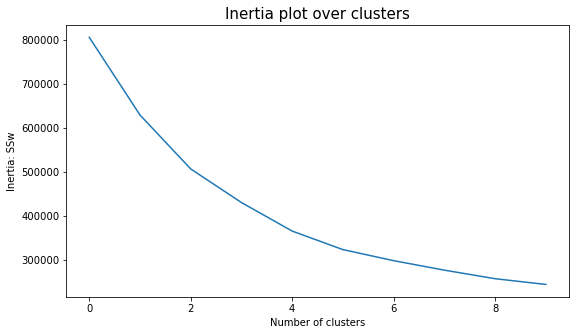

In [36]:
range_clusters = range(1, 11)
inertia = []
for n_clus in range_clusters:  # iterate over desired ncluster range
    kmclust = KMeans(n_clusters=n_clus, init='k-means++', n_init=15, random_state=1)
    kmclust.fit(df_scaled_pca[pca_feat_names])
    inertia.append(kmclust.inertia_)  # save the inertia of the given cluster solution

# The inertia plot
plt.figure(figsize=(9,5))
plt.plot(inertia)
plt.ylabel("Inertia: SSw")
plt.xlabel("Number of clusters")
plt.title("Inertia plot over clusters", size=15)
plt.show()

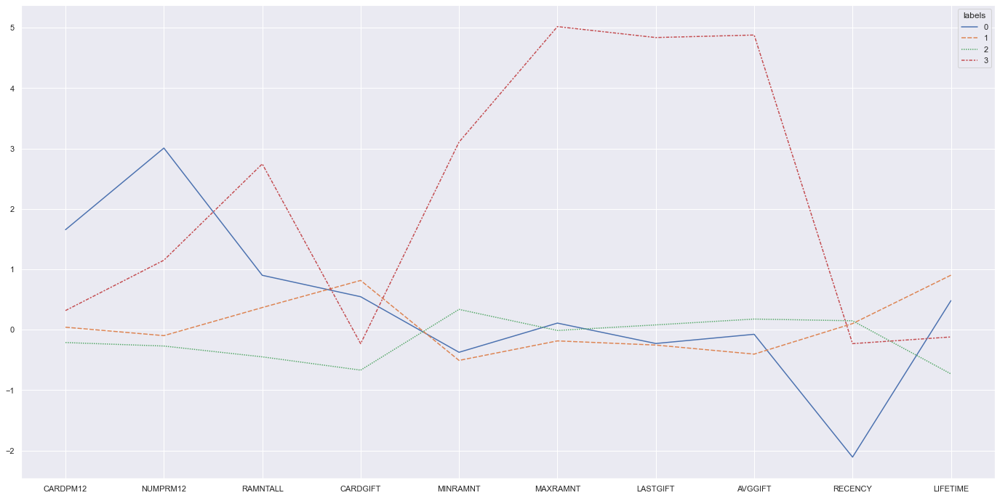

In [109]:
# Try K-means clustering on PCA features and plot with original data

kmclust = KMeans(n_clusters=4, init='k-means++', n_init=10, random_state=1)
kmclust.fit(pca_combined.pca_df_)
KM_labels = kmclust.labels_

meanplot_df(df_scaled, KM_labels)

In [123]:
parsed_dates = pd.to_datetime(data['DOB'], format='%Y-%m-%d' , errors='coerce') #errors='coerce' meant to return NaN in case of exception
data['DOB'] = parsed_dates
#Getting the age of every donor today
data['Age'] = ((pd.datetime.today() - data['DOB']).dt.days/365).floordiv(other=1).astype('int',errors='ignore')

In [126]:
income

,INCOME,Age,labels
1,6.0,48.0,2
3,1.0,72.0,1
4,3.0,80.0,0
6,4.0,40.0,1
11,1.0,77.0,2
...,...,...,...
95404,1.0,55.0,1
95406,6.0,52.0,1
95408,7.0,50.0,2
95410,7.0,60.0,0


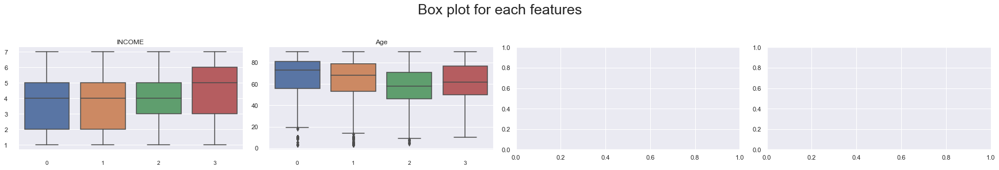

In [129]:
income = pd.merge(data[['INCOME','Age']].dropna(), right= pd.Series(KM_labels,name = 'labels',index = df_scaled.index), left_index=True, right_index=True)
boxplot_df(income[['INCOME','Age']],income['labels'])

## Try K-mean with original data

In [31]:
def fillna_numercial(df):
    df.fillna(df.median(), inplace=True)
    return df

fillna_numercial(df)

,CARDPM12,NUMPRM12,RAMNTALL,CARDGIFT,MINRAMNT,MAXRAMNT,LASTGIFT,AVGGIFT,RECENCY,LIFETIME
0,0.533756,0.252078,1.215883,1.975288,-0.385978,-0.509225,-0.568709,-0.629399,-0.087495,0.602533
1,0.533756,0.031861,-0.512110,-0.896621,0.280954,0.335151,0.606059,0.270829,-0.087495,-0.647344
2,0.533756,0.252078,0.875657,1.975288,-0.786136,-0.249417,-0.960299,-0.658986,-0.087495,0.549216
3,0.533756,0.252078,0.042996,0.428875,-0.786136,-0.574177,-0.568709,-0.734981,-0.087495,1.480068
4,3.812856,2.674461,1.341230,0.649791,-0.652750,-0.314369,-0.177120,-0.729032,-0.344031,4.009538


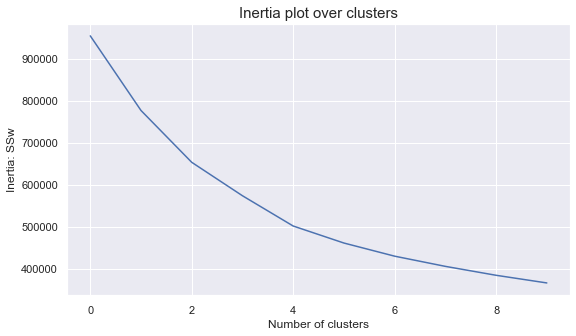

In [32]:
df_scaled = fillna_numercial(df_scaled)
range_clusters = range(1, 11)
inertia = []
for n_clus in range_clusters:  # iterate over desired ncluster range
    kmclust = KMeans(n_clusters=n_clus, init='k-means++', n_init=15, random_state=1)
    kmclust.fit(df_scaled)
    inertia.append(kmclust.inertia_)  # save the inertia of the given cluster solution

# The inertia plot
plt.figure(figsize=(9,5))
plt.plot(inertia)
plt.ylabel("Inertia: SSw")
plt.xlabel("Number of clusters")
plt.title("Inertia plot over clusters", size=15)
plt.show()

In [97]:
kmclust = KMeans(n_clusters=4, init="k-means++", n_init=10, random_state=1)
kmclust.fit(df_scaled)
# the predict method
KM_labels = kmclust.predict(df_scaled)

In [49]:
KM_labels.shape

(95397,)

In [105]:
def meanplot_df(df, labels):
    df_concat = pd.concat((df, pd.Series(labels, name='labels',index = df.index)), axis=1)
    plot_data = df_concat.groupby('labels').mean()
    # Plot PCA data
    fig, ax = plt.subplots(figsize = (24,12))
    ax = sns.lineplot(data = plot_data.T)
    plt.show()

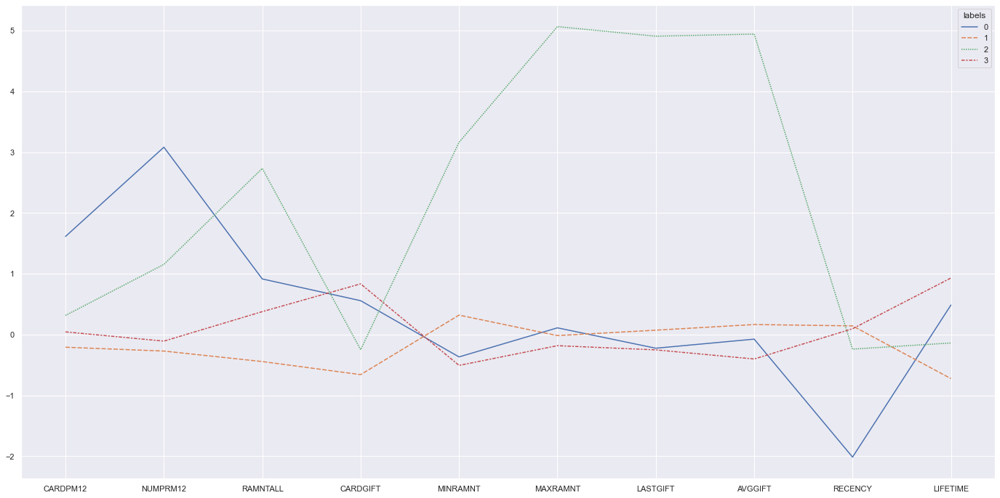

In [67]:
meanplot_df(df_scaled, KM_labels)

In [128]:
# Function to plot boxplot for each features based on clusters
def boxplot_df(df, labels):
    # Concatenate the dataframe with the labels
    df_concat = pd.concat((df, pd.Series(labels, name='labels', index = df.index)), axis=1)
    # Set up figure
    rows = math.ceil(df.shape[1]/4)
    sns.set()
    fig, axes = plt.subplots(rows,4, constrained_layout=True, figsize=(24,4*rows))
    fig.suptitle("Box plot for each features\n", fontsize=25)
    # Draw nested boxplots
    for col, ax in zip(df.columns, axes.flatten()):
        sns.boxplot(x='labels', y=col, data=df_concat, ax=ax )
        sns.despine(offset=10, trim=True,ax = ax)
        ax.set_xlabel(None)
        ax.set_ylabel(None)
        ax.tick_params(axis='x',labelsize = 'small') 
        ax.set_title(col)       

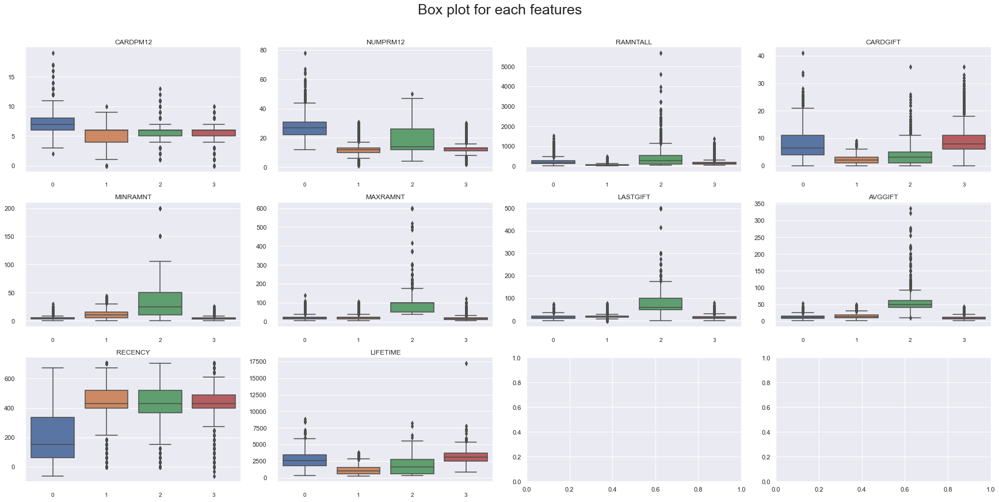

In [70]:
boxplot_df(data_gifts, KM_labels)

# **NEIGHBORHOOD FEATURES**

In [135]:
df = data[features_Neighborhood].copy()

## Variance threshhold - Removing features with low variance

In [136]:
selector = VarianceThreshold(0.5)
new_df = selector.fit_transform(df)
print('Original features:', df.shape[1])
print('Selected features:', new_df.shape[1])

Original features: 286
Selected features: 281


## Principle Features Analysis

In [45]:
#http://venom.cs.utsa.edu/dmz/techrep/2007/CS-TR-2007-011.pdf
#https://stats.stackexchange.com/questions/108743/methods-in-r-or-python-to-perform-feature-selection-in-unsupervised-learning

class PFA(object):
    def __init__(self, n_features, q=None):
        self.q = q
        self.n_features = n_features

    def fit(self, X):
        if not self.q:
            self.q = X.shape[1]

        sc = StandardScaler()
        X = sc.fit_transform(X)

        pca = PCA(n_components=self.q).fit(X)
        A_q = pca.components_.T

        kmeans = KMeans(n_clusters=self.n_features).fit(A_q)
        clusters = kmeans.predict(A_q)
        cluster_centers = kmeans.cluster_centers_

        dists = defaultdict(list)
        for i, c in enumerate(clusters):
            dist = euclidean_distances([A_q[i, :]], [cluster_centers[c, :]])[0][0]
            dists[c].append((i, dist))

        self.indices_ = [sorted(f, key=lambda x: x[1])[0][0] for f in dists.values()]
        self.features_ = X[:, self.indices_]

In [10]:
df.dropna(axis = 1,inplace=True)

In [46]:
pfa = PFA(n_features=50)
pfa.fit(df)

# To get the transformed matrix
X = pfa.features_

# To get the column indices of the kept features
column_indices = pfa.indices_

TypeError: __init__() missing 1 required positional argument: 'n_features'

In [34]:
X.shape

(95412, 50)

In [35]:
df.columns[column_indices]

Index(['POP901', 'DW5', 'ETH2', 'HV2', 'ETH7', 'ETH8', 'HHAS2', 'IC23',
       'ETH14', 'AGE904', 'HU5', 'AGEC3', 'AGEC4', 'EC3', 'MARR4', 'DW7',
       'HHD6', 'HHD10', 'EIC11', 'ETHC2', 'ETHC6', 'HVP4', 'HUR1', 'RHP1',
       'LSC4', 'IC7', 'IC11', 'IC16', 'SEC1', 'HHAS1', 'TPE12', 'TPE13',
       'ANC6', 'OCC13', 'EIC5', 'ANC13', 'OEDC4', 'OEDC5', 'EC5', 'VOC3',
       'ANC8', 'ANC14', 'LSC3', 'VOC1', 'HC2', 'HC3', 'HC4', 'HC8', 'HC9',
       'AC1'],
      dtype='object')